# 使用 {class}`~PIL.Image` 类

{class}`~PIL.Image` 三大功能：

- Image Archives（图像档案）：图像存储并支持批处理应用程序
- Image Display（图像展示）：包括 tk 的 `PhotoImage` 和 `BitmapImage` 接口，以及 Windows DIB 接口（可以与 pythonwin 及其他基于 Windows 的工具包一起使用）。使用 `show` 方法将图像保存到磁盘，并调用外部显示应用程序。
- Image Progressing（图像处理）：包括点操作、使用一组内置卷积核进行过滤以及颜色空间转换；支持图像的大小调整、旋转和仿射变换。

## 使用 {meth}`Image.open` 方法从文件加载图像

In [2]:
from PIL import Image

im = Image.open('../images/leimu.jpg') # 若无法打开，会引起 `IOError` 异常

In [3]:
im.format # 标识图片的源格式

'JPEG'

In [4]:
im.size  # (宽度, 高度)

(1154, 902)

常用的 `mode` 有："L"（亮度，灰度图）、"RGB"（真彩色图像）、"CMYK"（预压图像）

In [5]:
im.mode  # 图像中带区的编号和名称，以及像素类型和深度

'RGB'

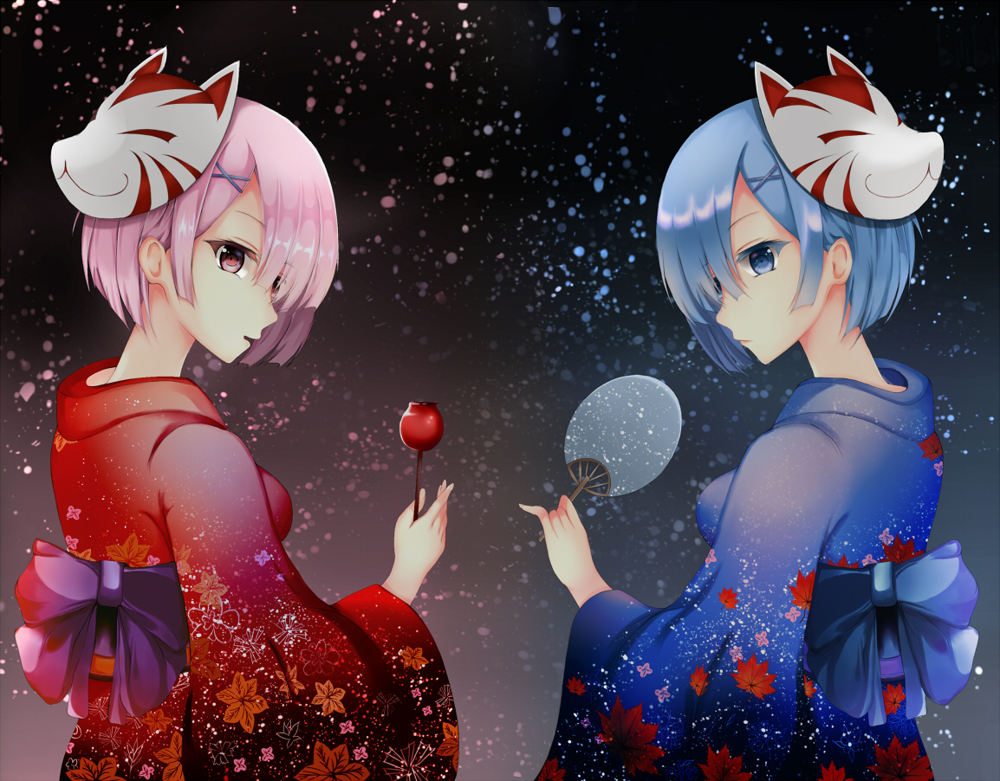

In [7]:
# im.show() # 开启窗口显示
im # 在显示屏显示图像(IPython)

## 1.2 使用 `save` 保存图像

In [8]:
from pathlib import Path

temp_dir = Path(".temp")
temp_dir.mkdir(parents=True, exist_ok=True)

In [9]:
filename = im.filename.split('/')[-1] # 获取文件名
filename = temp_dir/filename
im.save(filename) # 保存到磁盘

可以使用 `thumbnail` 方法创建指定大小的缩略图：

In [27]:
size = (128, 128)
im.thumbnail(size)
im.save(temp_dir/f'{filename.name.removesuffix(filename.suffix)}.thumnail', 'JPEG')

## 1.3 剪切、粘贴与合并图像

注意：Pillow 使用的是左上角坐标为 $(0,0)$ 的 $x$ 与 $y$ 轴的正方向分别为：水平向右，竖直向下。

使用 `crop` 方法从图像中提取子矩形块：

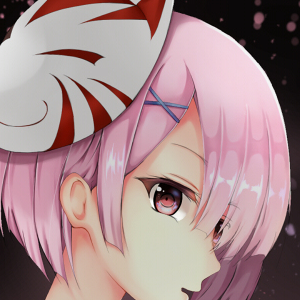

In [28]:
box = (100, 100, 400, 400) # (左, 上, 右, 下)
im = Image.open('../images/leimu.jpg')
region = im.crop(box)

region

使用 `paste` 方法可用于粘贴图像：

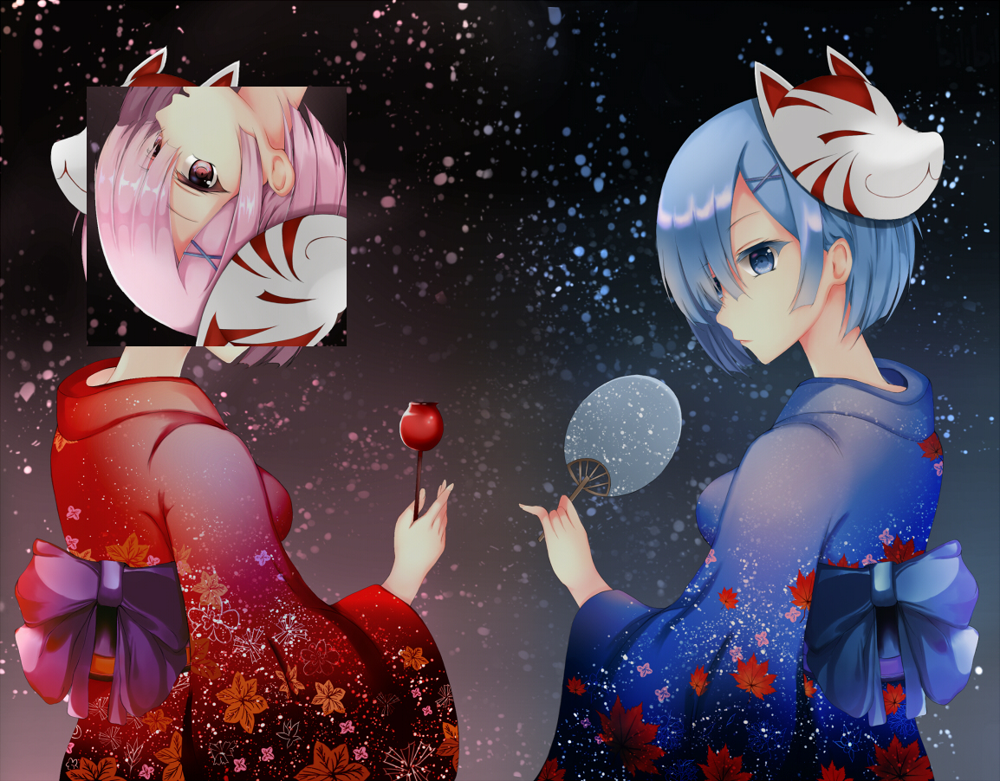

In [29]:
region = region.transpose(Image.ROTATE_180) # 将子图像块倒置
im.paste(region, box) # 粘贴回去

im

## 1.4 滚动图像

In [30]:
def rool(image, delta):
    '''从一侧滚动图像'''
    w, h = image.size
    
    delta %= w
    if delta == 0: return image
    
    part1 = image.crop((0, 0, delta, h))
    part2 = image.crop((delta, 0, w, h))
    part1.paste(part1, (w-delta, 0, w, h))
    part2.paste(part2, (0, 0, w-delta, h))
    return image

In [31]:
im = Image.open('../images/leimu.jpg')
delta = 70
image = rool(im, delta)

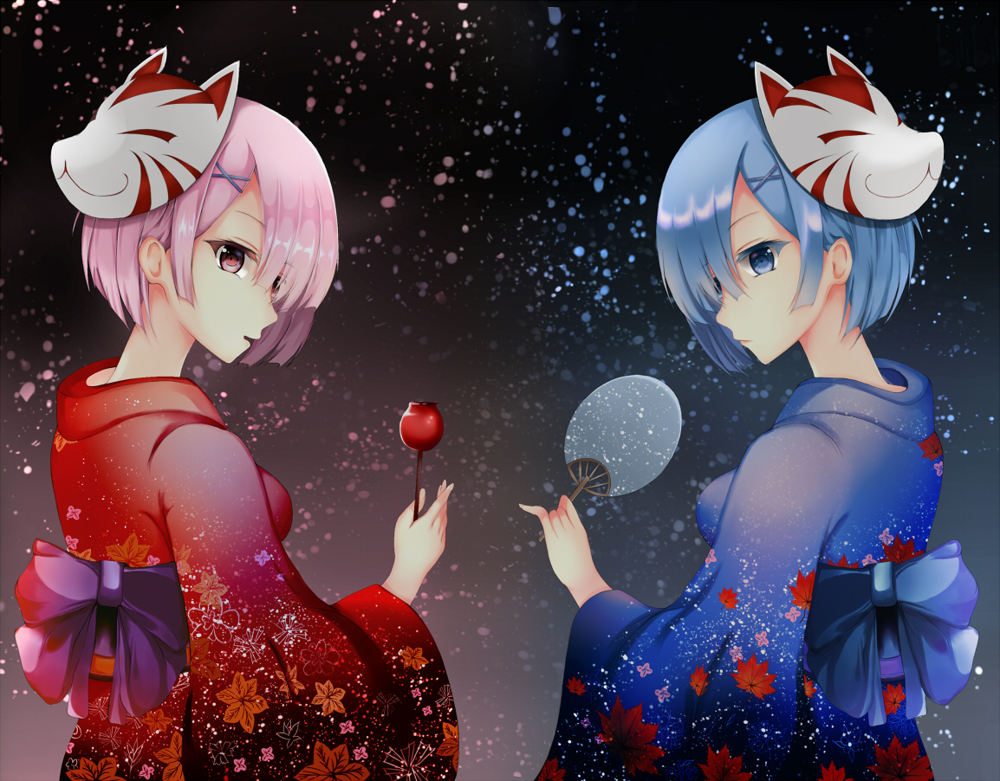

In [32]:
image

## 1.5 拆分与合并 bands

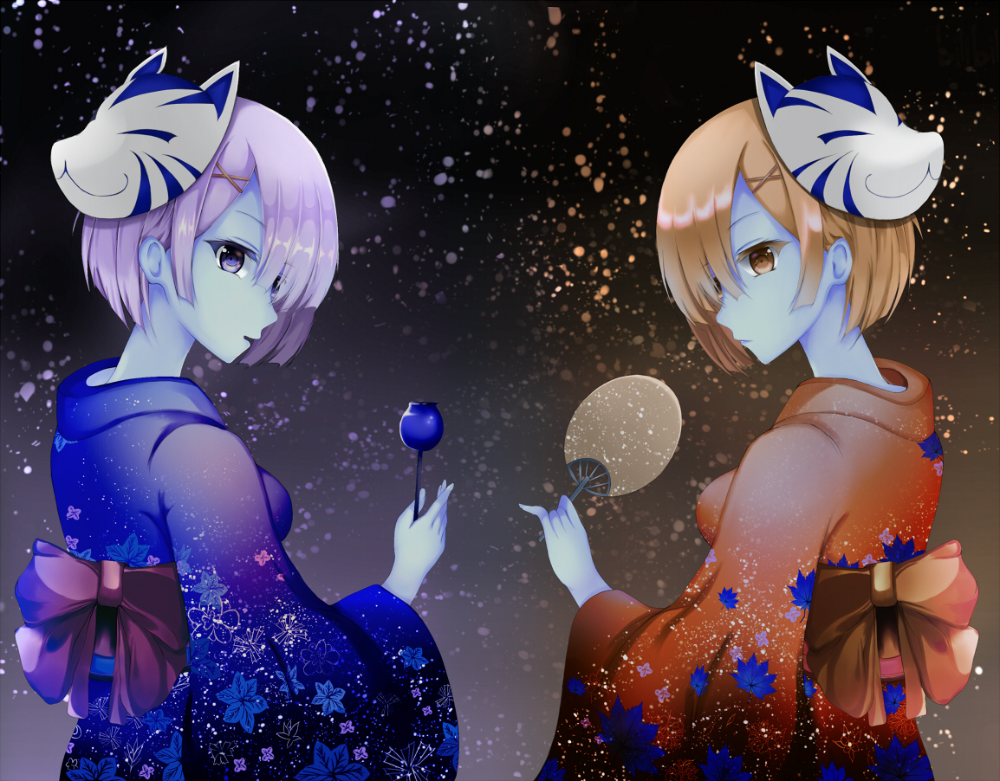

In [33]:
r, g, b = im.split()
im = Image.merge("RGB", (b, g, r)) # 转换为 BGR
im

## 1.6 几何变换

`resize` 与 `rotate`:

In [34]:
out = im.resize((32, 32)) # 改变尺寸
out = im.rotate(45)  # 旋转 45 度

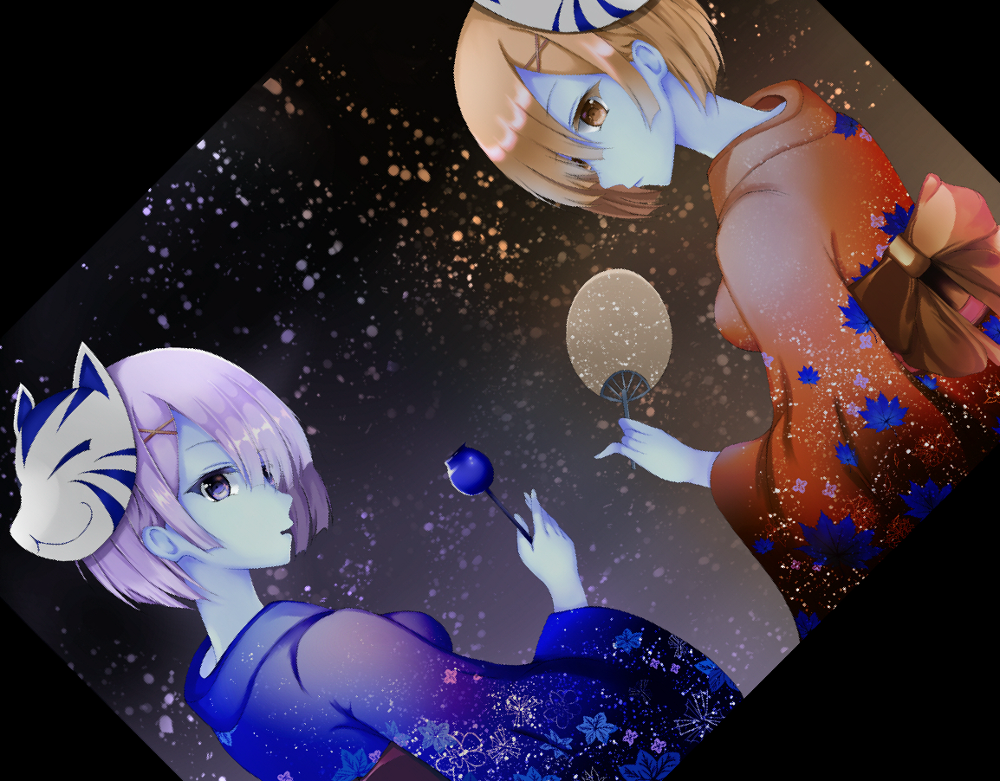

In [35]:
out

转置图片有 `transpose` 和 `transform` 方法。


## 1.7 颜色空间变换

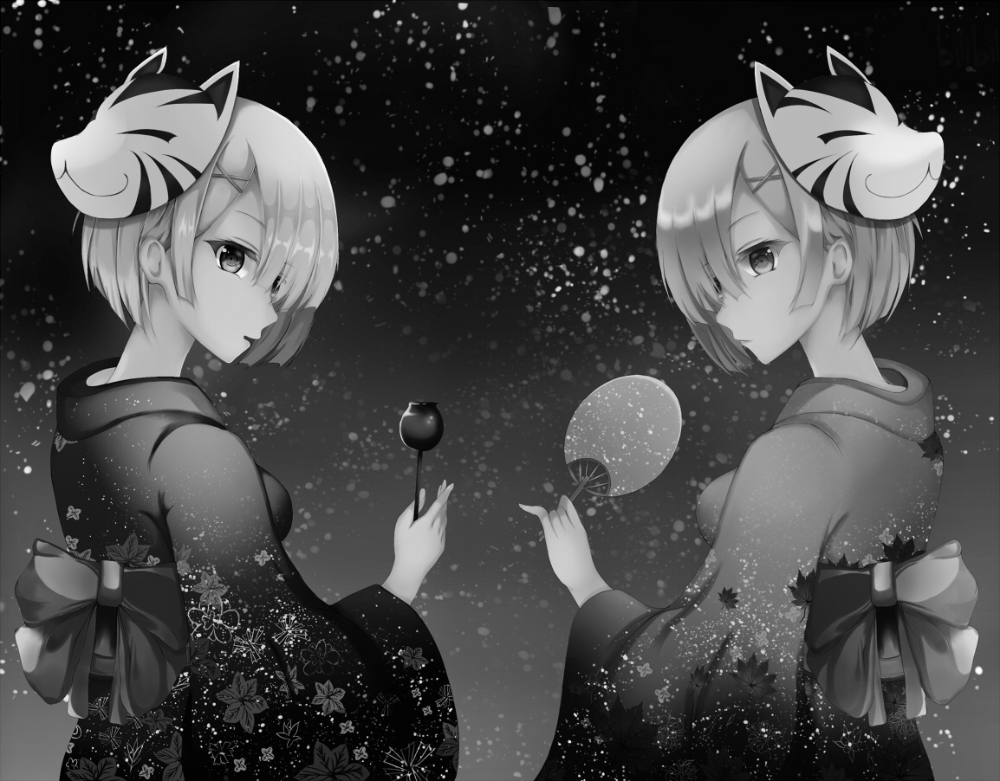

In [36]:
im.convert('L')  # 转换为黑白图

In [37]:
from PIL import ImageDraw

In [38]:
p = ImageDraw.Draw(im)

In [39]:
p.rectangle((0, 0, 200, 200), width=1, fill='red')

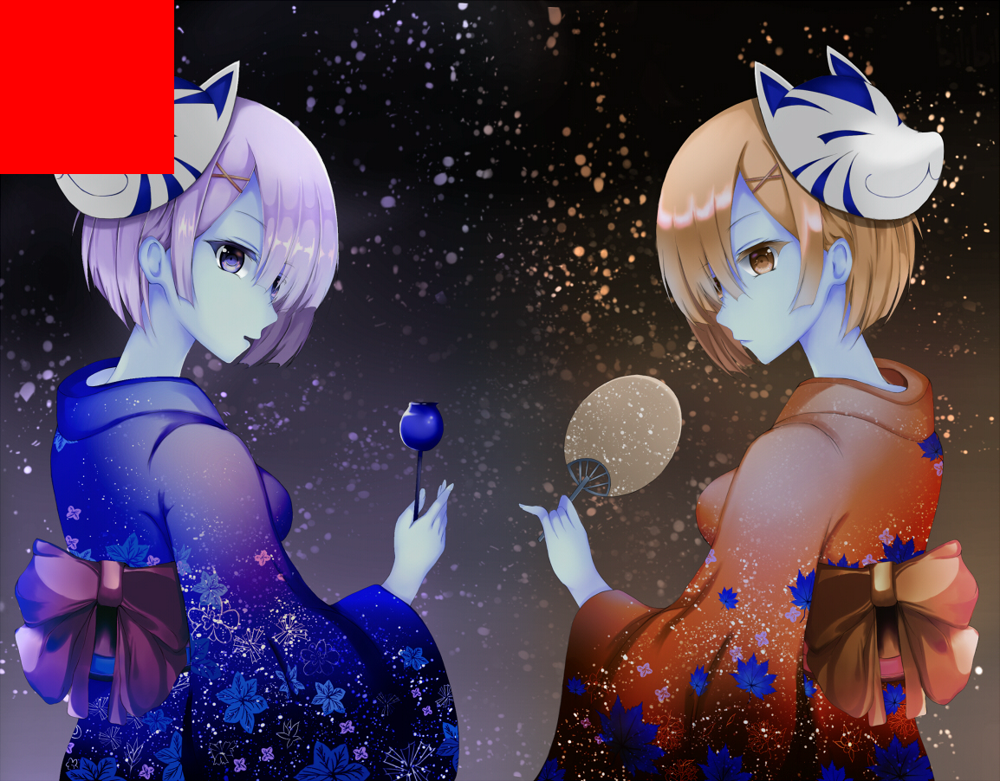

In [40]:
im